# U-Net을 이용한 iiit dataset semantic segmentation

U-net 논문 링크 : https://arxiv.org/abs/1505.04597

### [IIIT Dataset](https://www.robots.ox.ac.uk/~vgg/data/pets/)
- 3개의 라벨(동물, 동물의 경계, 배경)
- 37개의 강아지와 고양이 종류로 구성
- 1종당 약 200장 이미지
- train: 3,680 image
- test: 3,669 image



In [1]:
import tensorflow as tf
import tensorflow_datasets as tfds

# Data part

In [2]:
# load pascal oxford-iit dataset using tfds
dataset, info = tfds.load('oxford_iiit_pet:3.*.*', with_info=True)

Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Extraction completed...: 0 file [00:00, ? file/s]

Generating splits...:   0%|          | 0/2 [00:00<?, ? splits/s]

Generating train examples...:   0%|          | 0/3680 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/oxford_iiit_pet/3.2.0.incompleteZ9C3CJ/oxford_iiit_pet-train.tfrecord*...:…

Generating test examples...:   0%|          | 0/3669 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/oxford_iiit_pet/3.2.0.incompleteZ9C3CJ/oxford_iiit_pet-test.tfrecord*...: …

Dataset oxford_iiit_pet downloaded and prepared to /root/tensorflow_datasets/oxford_iiit_pet/3.2.0. Subsequent calls will reuse this data.


[PrefetchDataset](
https://www.tensorflow.org/jvm/api_docs/java/org/tensorflow/op/data/PrefetchDataset?hl=ko)
- 'input_dataset'에서 요소를 비동기식으로 프리페치하는 데이터세트를 생성합니다.
- 모델이 학습을 수행하는 동안 다음 에폭에 사용될 데이터를 미리 로드
- 데이터 로드와 모델 학습이 겹쳐져 처리 속도 향상

![img](https://img1.daumcdn.net/thumb/R1280x0/?scode=mtistory2&fname=https%3A%2F%2Fblog.kakaocdn.net%2Fdn%2Fb8qZHO%2Fbtrp7G27WuA%2FBDnT9xh8Dur0LCdZw2HVs0%2Fimg.png)


In [5]:
def normalize_oxford_iiit(input_image, input_mask):
  # tf.float32으로 dtype 변경
  input_image = tf.cast(input_image, tf.float32) / 255.0
  input_mask -= 1  # set value 1,2,3 -> 0,1,2
  return input_image, input_mask


In [6]:
def load_image_train(datapoint):

  input_image = tf.image.resize(datapoint['image'], (128, 128))
  input_mask = tf.image.resize(datapoint['segmentation_mask'], (128, 128))

  # 균일 분포(uniform distribution)을 가지는 난수 생성 후 비교
  if tf.random.uniform(()) > 0.5:
    input_image = tf.image.flip_left_right(input_image)
    input_mask = tf.image.flip_left_right(input_mask)
  orig_input_mask = input_mask
  input_image, input_mask = normalize_oxford_iiit(input_image, input_mask)
  return input_image, input_mask

In [7]:
buffer_size = 1000
batch_size = 64

# train = dataset['train'].map(load_image_train, num_parallel_calls=tf.data.experimental.AUTOTUNE)
train = dataset['train'].map(load_image_train, num_parallel_calls=tf.data.AUTOTUNE)
train_data = train.cache().shuffle(buffer_size).batch(batch_size).repeat()
train_data = train_data.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)

- [cache](https://www.tensorflow.org/api_docs/python/tf/data/Dataset#cache): 메모리에 올려두겠다.
- [shuffle](https://www.tensorflow.org/api_docs/python/tf/data/Dataset#shuffle): 섞어주겠다.
- [batch](https://www.tensorflow.org/api_docs/python/tf/data/Dataset#batch): 배치단위로 묶어주겠다.
- [repeat](https://www.tensorflow.org/api_docs/python/tf/data/Dataset#repeat): 넘겨받은 횟수만큼 값을 반복시켜줌(if `count` is `None` or `-1` is for the dataset be repeated indefinitely.)

In [8]:
import os
import matplotlib.pyplot as plt
import numpy as np

# display image
def display(display_list):
  plt.figure(figsize=(15, 15))

  title = ['Input Image', 'True Mask', 'Predicted Mask']

  for i in range(len(display_list)):
    plt.subplot(1, len(display_list), i+1)
    plt.title(title[i])
    plt.imshow(tf.keras.preprocessing.image.array_to_img(display_list[i]))
    plt.axis('off')
  plt.show()

# display image and save
def display_and_save(display_list, epoch):
  plt.figure(figsize=(15, 15))

  title = ['Input Image', 'True Mask', 'Predicted Mask']

  for i in range(len(display_list)):
    plt.subplot(1, len(display_list), i+1)
    plt.title(title[i])
    plt.imshow(tf.keras.preprocessing.image.array_to_img(display_list[i]))
    plt.axis('off')
  plt.savefig(f'epoch {epoch}.jpg')

# make prediction mask
def create_mask(pred_mask):
  pred_mask = tf.argmax(pred_mask, axis=-1)
  pred_mask = pred_mask[..., tf.newaxis]

  return pred_mask[0]

# show prediction
def show_predictions(model, sample_image, sample_mask):
  display([sample_image, sample_mask, create_mask(model.predict(sample_image[tf.newaxis, ...]))])

# display and save prediction
def save_predictions(epoch, model, sample_image, sample_mask):
  display_and_save([sample_image, sample_mask, create_mask(model.predict(sample_image[tf.newaxis, ...]))], epoch)

# set custom callback
class CustomCallback(tf.keras.callbacks.Callback):
  def __init__(self, unet_model, sample_image, sample_mask):
    super(CustomCallback, self).__init__()
    self.unet_model = unet_model
    self.sample_image = sample_image
    self.sample_mask = sample_mask

  def on_epoch_end(self, epoch, logs=None):
    save_predictions(epoch+1, self.unet_model, self.sample_image, self.sample_mask)
    print (f'\n에포크 이후 예측 예시 {epoch+1}\n')

# Model part

In [28]:
import tensorflow as tf

class UNET_OXFORD_IIIT(tf.keras.Model):
    def __init__(self, num_classes):
        super(UNET_OXFORD_IIIT, self).__init__()

        # 입력 레이어 정의
        inputs = tf.keras.layers.Input((128, 128, 3))  # 이미지 크기는 128x128 픽셀이고, 채널은 RGB(3)입니다.

        # Contracting 파트: 이미지를 작은 특징으로 압축하는 부분
        contracting_filters = [64, 128, 256, 512, 1024]  # 각 Conv 레이어의 필터 수

        x = inputs
        skip_connections = []  # 각 Contracting 레이어에서 나온 특징을 저장하기 위한 리스트

        for filters in contracting_filters:
            x = self.conv_block(x, filters)
            skip_connections.append(x)  # 현재 레이어의 출력을 저장
            x = self.pooling(x)

        # Expansive 파트: 작은 특징을 다시 원래 크기로 복원하는 부분
        expansive_filters = [512, 256, 128, 64]

        # Contracting 부분에서 얻은 skip_connections 리스트를 역순으로 사용
        skip_connections = skip_connections[::-1]

        for filters, skip in zip(expansive_filters, skip_connections):
            x = self.upconv_block(x, skip, filters)
            x = self.conv_block(x, filters)

        # 최종 출력 레이어: 클래스 수에 맞는 출력 생성
        conv10 = tf.keras.layers.Conv2D(num_classes, 1, activation=None)(x)

        model = tf.keras.Model(inputs=inputs, outputs=conv10)

        self.model = model

        # 모델 구조 출력
        self.model.summary()

    def call(self, x):
        return self.model(x)

    def conv_block(self, x, filters):
        # Convolution 연산을 두 번 적용하여 레이어 구성
        x = tf.keras.layers.Conv2D(filters, 3, activation='relu', padding='same', kernel_initializer='he_normal')(x)
        x = tf.keras.layers.Conv2D(filters, 3, activation='relu', padding='same', kernel_initializer='he_normal')(x)
        return x

    def pooling(self, x):
        # Max pooling 레이어
        return tf.keras.layers.MaxPooling2D(pool_size=(2, 2))(x)

    def upconv_block(self, x, skip, filters):
        # UpSampling 및 Convolution 연산을 통한 Upconvolution 레이어
        up = tf.keras.layers.Conv2D(filters, 2, activation='relu', padding='same', kernel_initializer='he_normal')(
            tf.keras.layers.UpSampling2D(size=(2, 2))(x))
        return tf.keras.layers.concatenate([skip, up], axis=3)


In [23]:
# checkpoint_path = "save_model"
num_classes = 3
unet_model = UNET_OXFORD_IIIT(num_classes)

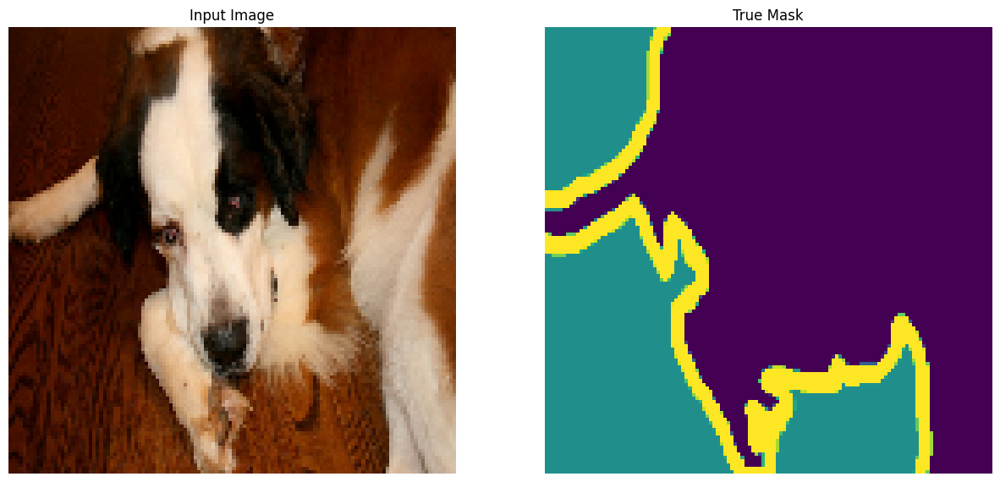

In [24]:
for iter, batch_data in enumerate(train_data):
  if iter >= 2:  # manually detect the end of the epoch
    break
  batch_image, batch_mask = batch_data[0], batch_data[1]
  sample_image, sample_mask = batch_image[0], batch_mask[0]
display([sample_image, sample_mask])


1/1 [==============================] - 0s 292ms/step


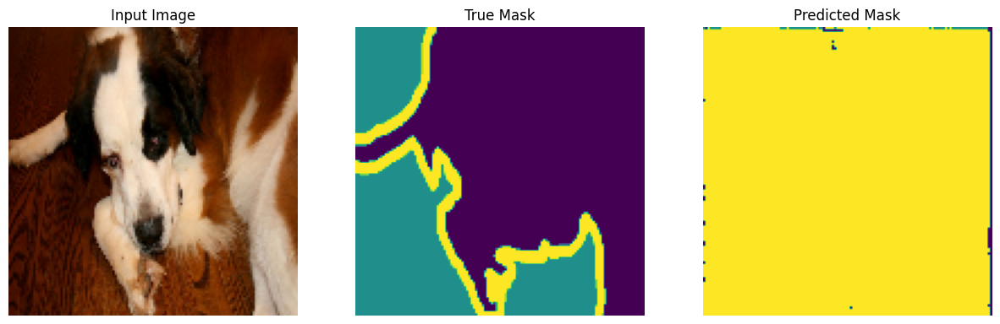

In [25]:
# show prediction before training
show_predictions(unet_model, sample_image, sample_mask)

In [30]:
num_classes = 3
unet_model = UNET_OXFORD_IIIT(num_classes)

learning_rate = 0.001

unet_model.compile(
    optimizer = tf.optimizers.Adam(learning_rate),
    # 모델 마지막 layer에서 activation이 None 이었기에 from_logits=True
    # logit: sigmoid or softmax처럼 한정된 범위로 norm 하겠느냐?
    loss = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
    metrics = ['accuracy'])

Model: "model_6"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_7 (InputLayer)        [(None, 128, 128, 3)]        0         []                            
                                                                                                  
 conv2d_144 (Conv2D)         (None, 128, 128, 64)         1792      ['input_7[0][0]']             
                                                                                                  
 conv2d_145 (Conv2D)         (None, 128, 128, 64)         36928     ['conv2d_144[0][0]']          
                                                                                                  
 max_pooling2d_24 (MaxPooli  (None, 64, 64, 64)           0         ['conv2d_145[0][0]']          
 ng2D)                                                                                      

Epoch 1/5
  6/500 [..............................] - ETA: 2:40 - loss: 41.5711 - accuracy: 0.5446

500/500 [==============================] - ETA: 0s - loss: 1.1744 - accuracy: 0.7408

1/1 [==============================] - 0s 372ms/step

에포크 이후 예측 예시 1

500/500 [==============================] - 167s 321ms/step - loss: 1.1744 - accuracy: 0.7408
Epoch 2/5
1/1 [==============================] - 0s 21ms/step

에포크 이후 예측 예시 2

500/500 [==============================] - 161s 322ms/step - loss: 0.4949 - accuracy: 0.8167
Epoch 3/5
1/1 [==============================] - 0s 36ms/step

에포크 이후 예측 예시 3

500/500 [==============================] - 162s 323ms/step - loss: 0.3524 - accuracy: 0.8681
Epoch 4/5
1/1 [==============================] - 0s 36ms/step

에포크 이후 예측 예시 4

500/500 [==============================] - 161s 323ms/step - loss: 0.2571 - accuracy: 0.9034
Epoch 5/5
1/1 [==============================] - 0s 56ms/step

에포크 이후 예측 예시 5

500/500 [==============================] - 163s 325ms/step - loss: 0.2029 - accuracy: 0.9204


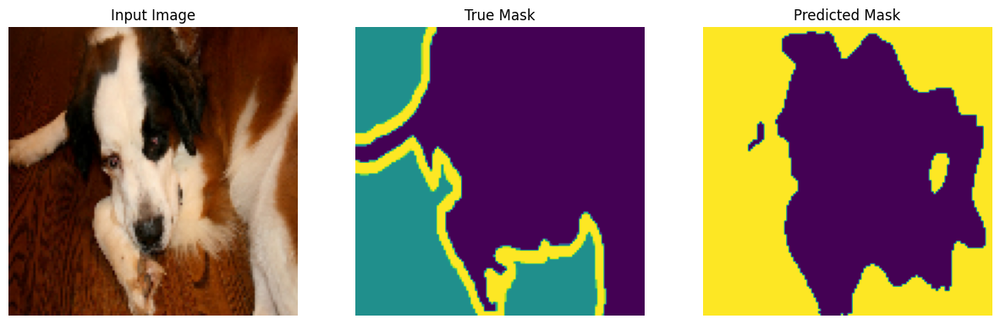

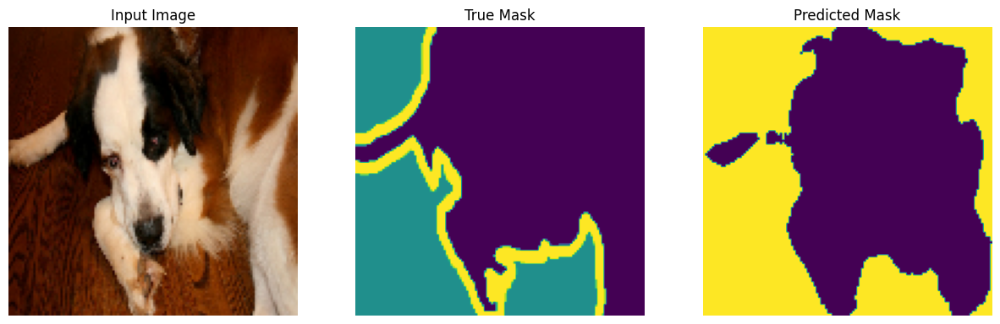

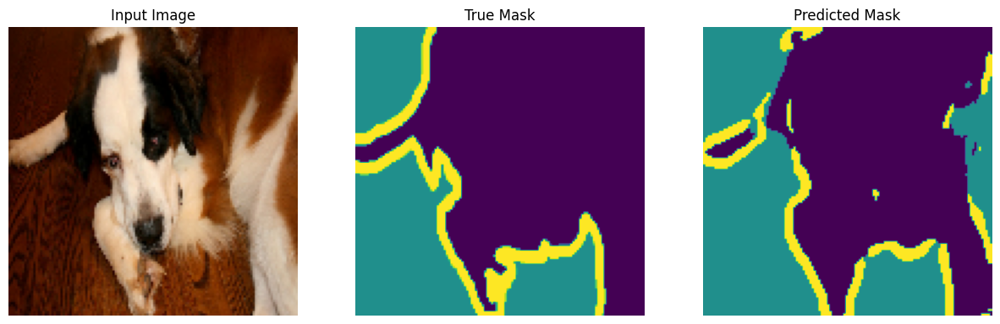

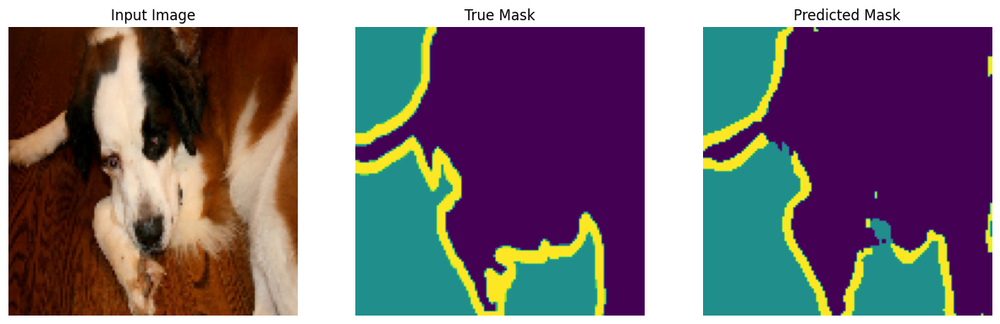

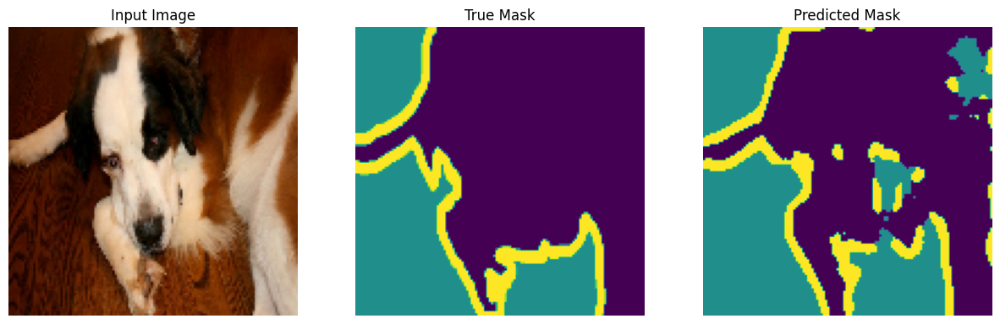

In [31]:
steps_per_epoch = 500
num_epochs = 5

unet_model.fit(train_data,
              steps_per_epoch=steps_per_epoch,
              epochs=num_epochs,
              callbacks=[CustomCallback(unet_model, sample_image, sample_mask)])

# Model save & load

In [34]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [35]:
checkpoint_path = "/content/drive/MyDrive/model_save_dir"
unet_model.save(checkpoint_path)

In [36]:
from tensorflow import keras
trained_unet_model = keras.models.load_model(checkpoint_path)

# Evalute

In [37]:
def normalize_oxford_iiit(input_image, input_mask):
  input_image = tf.cast(input_image, tf.float32) / 255.0
  input_mask -= 1  # set value 1,2,3 -> 0,1,2
  return input_image, input_mask

def load_image_test(datapoint):
  input_image = tf.image.resize(datapoint['image'], (128, 128))
  input_mask = tf.image.resize(datapoint['segmentation_mask'], (128, 128))

  input_image, input_mask = normalize_oxford_iiit(input_image, input_mask)

  return input_image, input_mask

test = dataset['test'].map(load_image_test)
test_data = test.batch(batch_size)

1/1 [==============================] - 0s 158ms/step


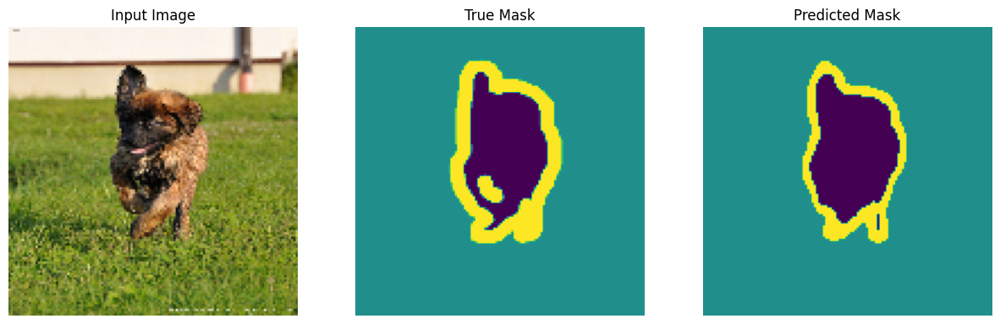

1/1 [==============================] - 0s 98ms/step


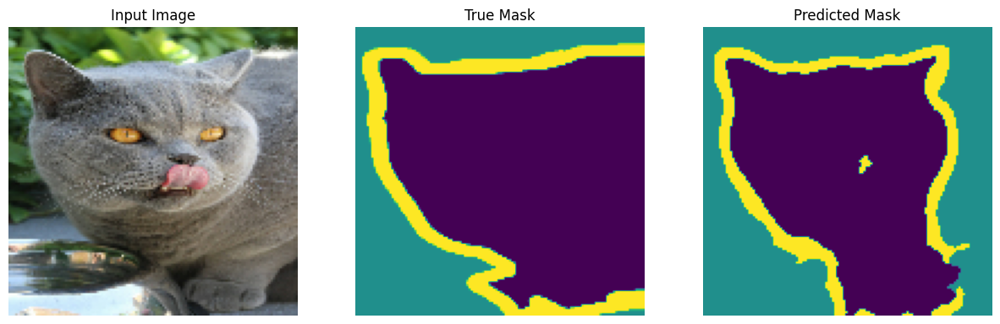

1/1 [==============================] - 0s 120ms/step


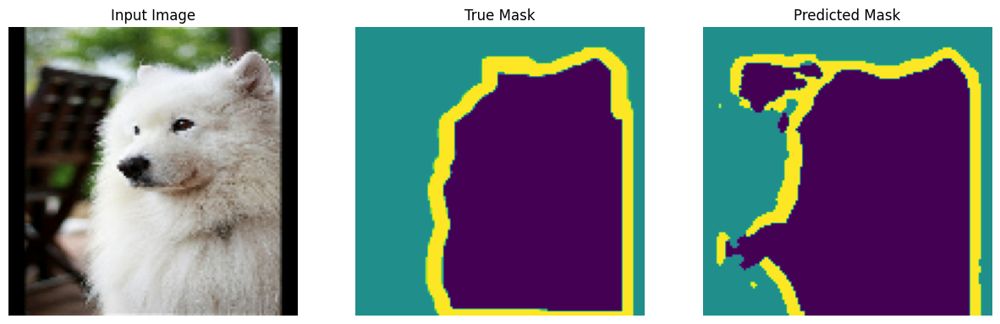

1/1 [==============================] - 0s 55ms/step


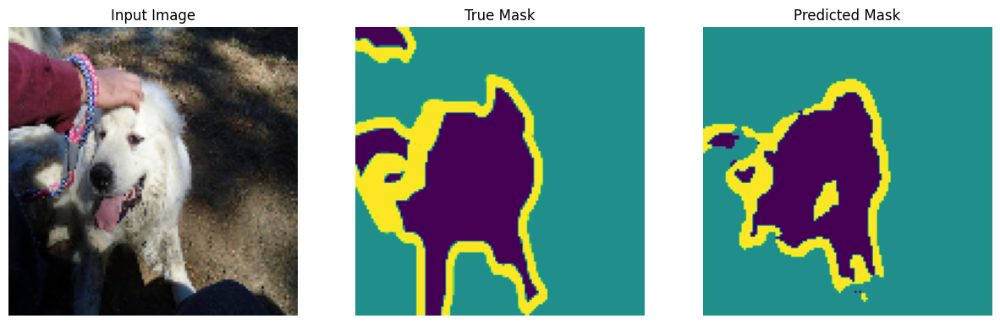

1/1 [==============================] - 0s 34ms/step


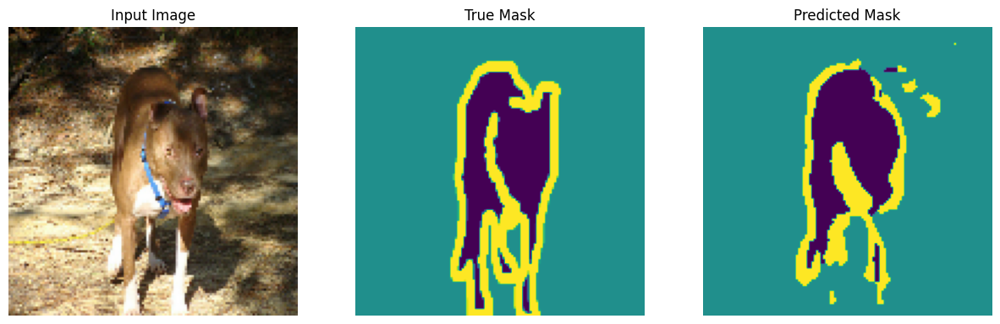

1/1 [==============================] - 0s 54ms/step


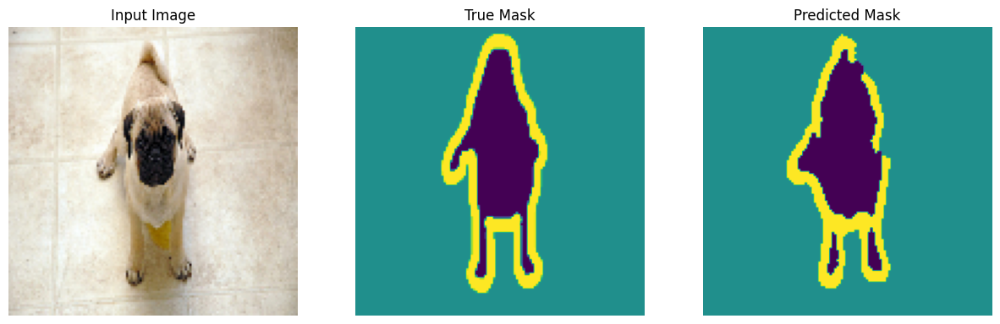

1/1 [==============================] - 0s 37ms/step


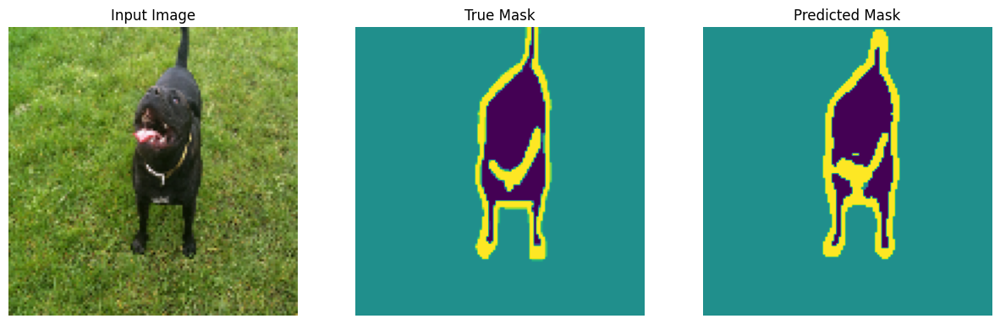

1/1 [==============================] - 0s 37ms/step


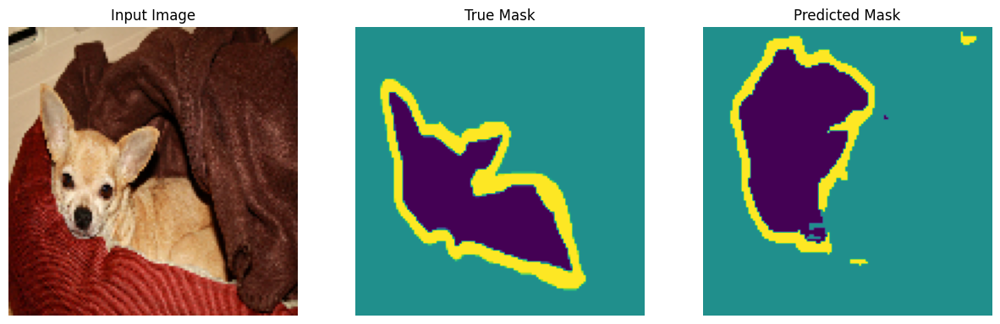

1/1 [==============================] - 0s 33ms/step


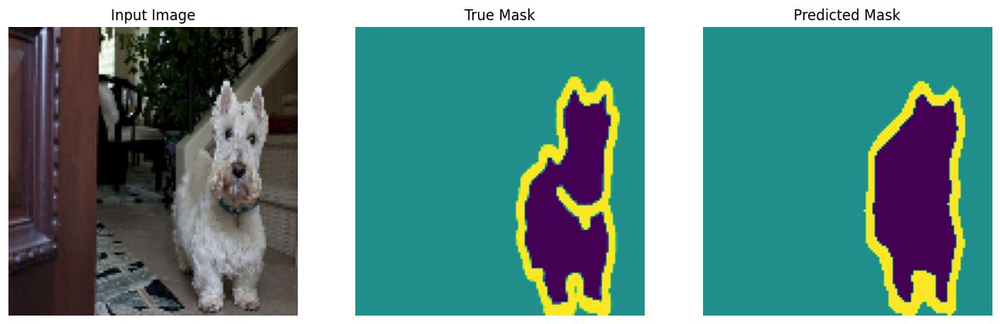

1/1 [==============================] - 0s 41ms/step


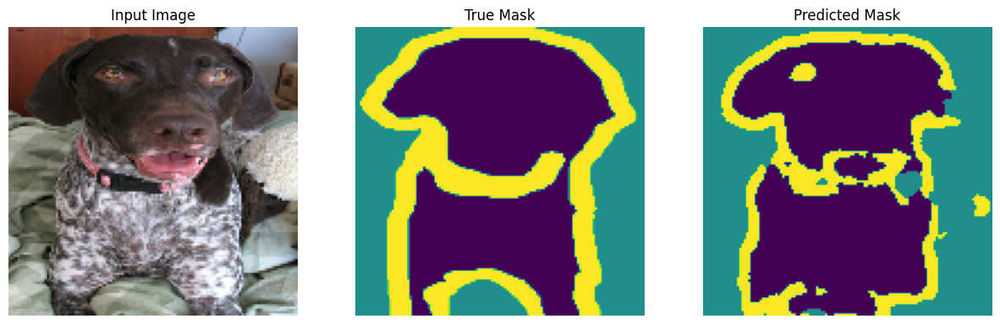

1/1 [==============================] - 0s 99ms/step


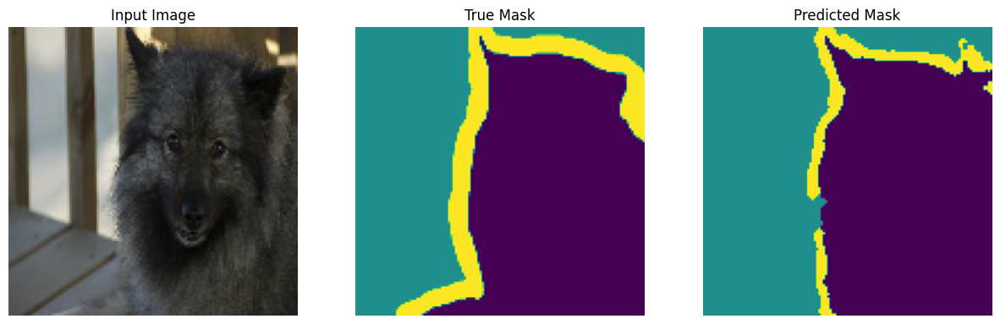

1/1 [==============================] - 0s 47ms/step


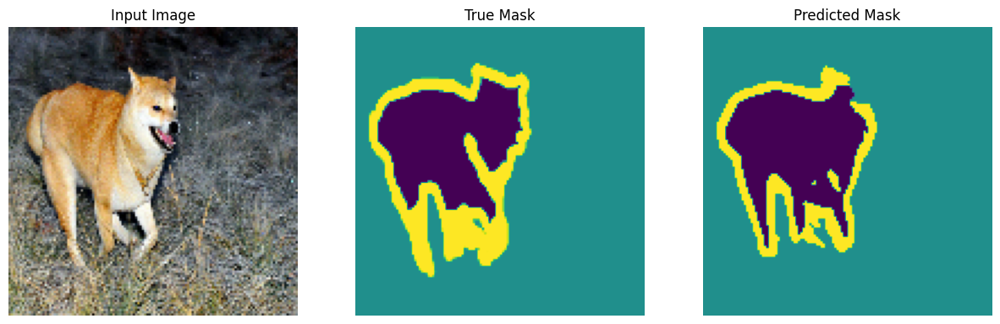

1/1 [==============================] - 0s 37ms/step


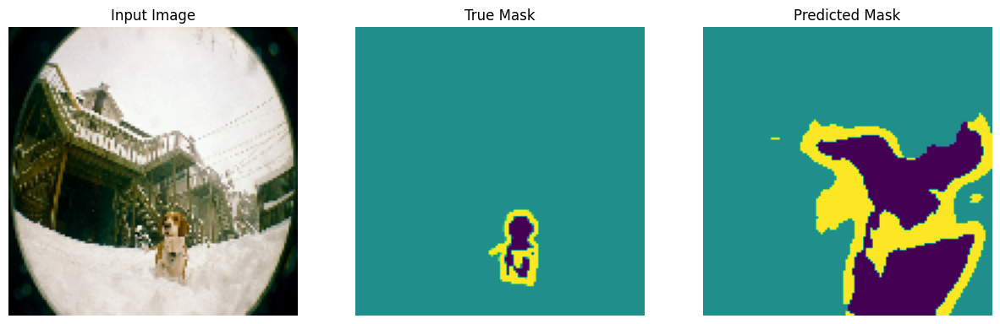

1/1 [==============================] - 0s 32ms/step


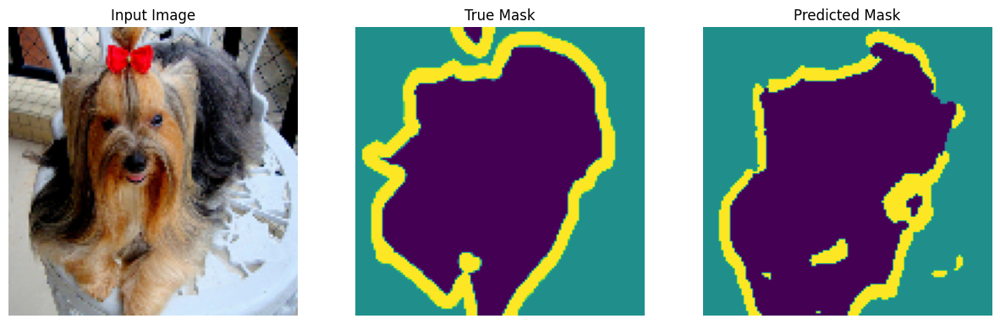

1/1 [==============================] - 0s 118ms/step


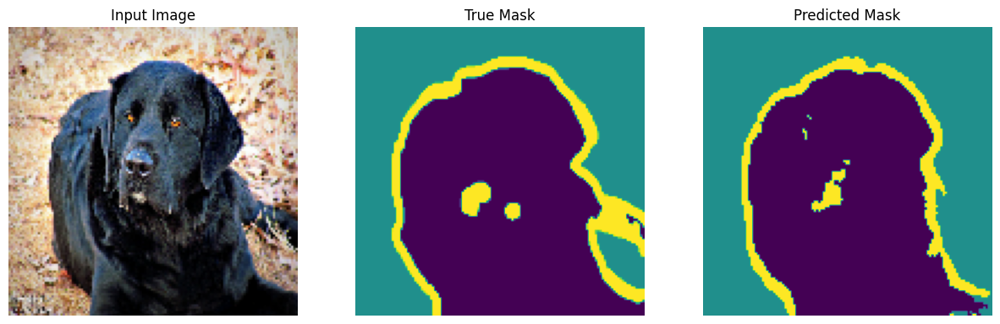

1/1 [==============================] - 0s 73ms/step


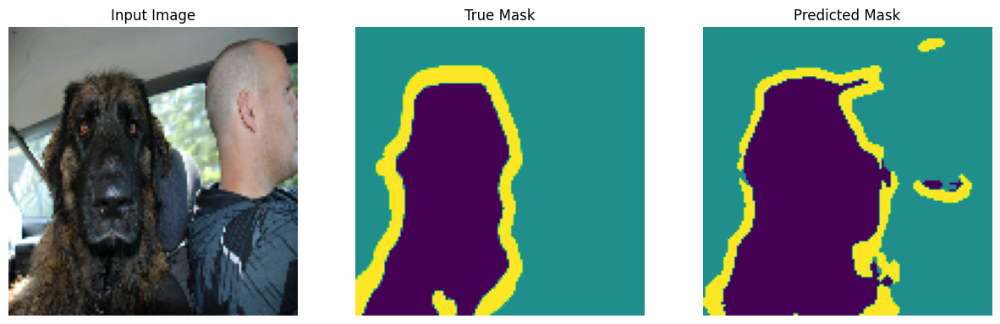

1/1 [==============================] - 0s 103ms/step


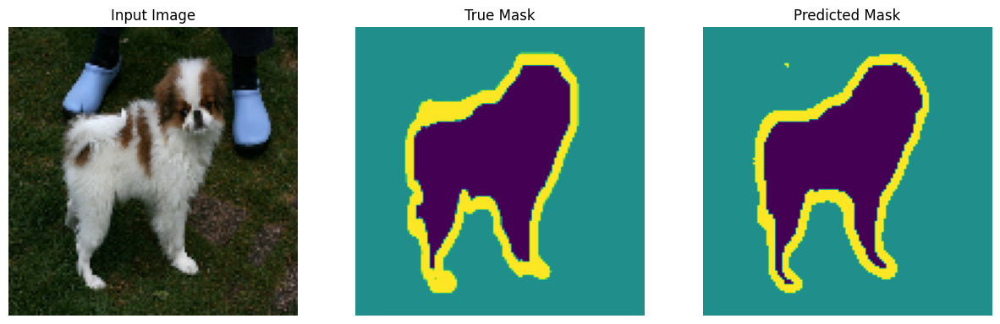

1/1 [==============================] - 0s 130ms/step


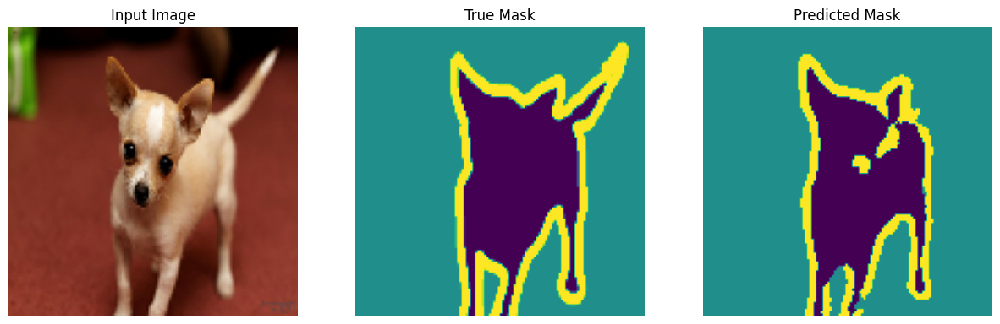

1/1 [==============================] - 0s 133ms/step


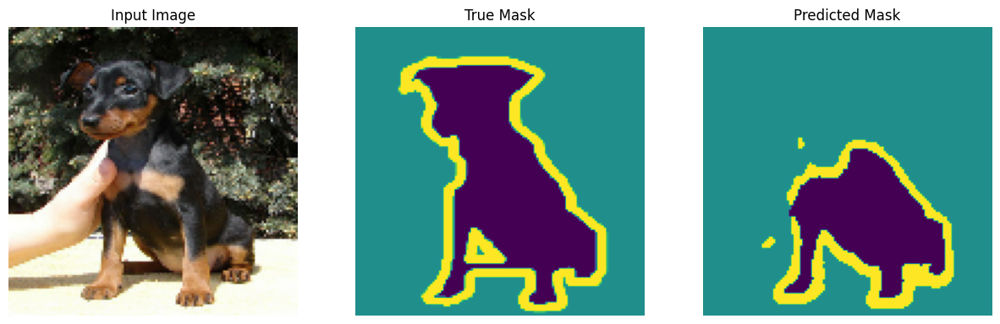

1/1 [==============================] - 0s 106ms/step


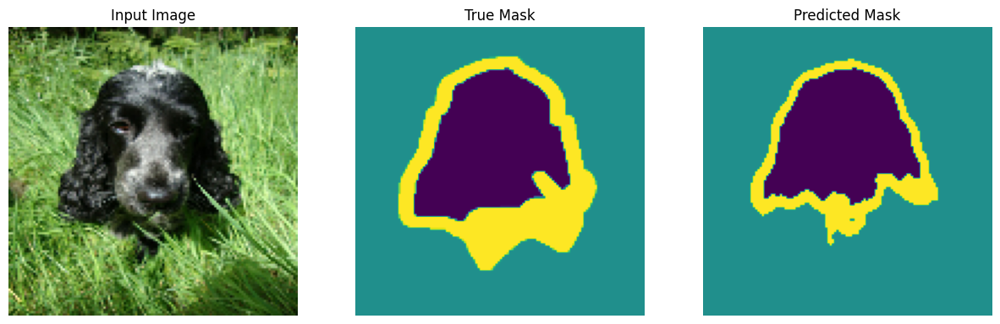

1/1 [==============================] - 0s 117ms/step


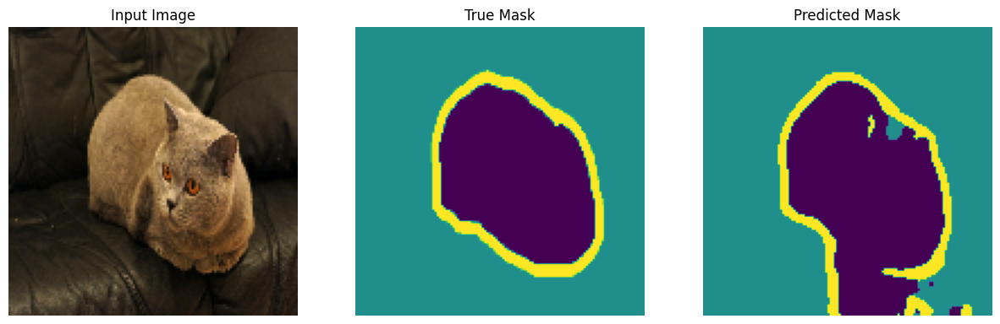

1/1 [==============================] - 0s 94ms/step


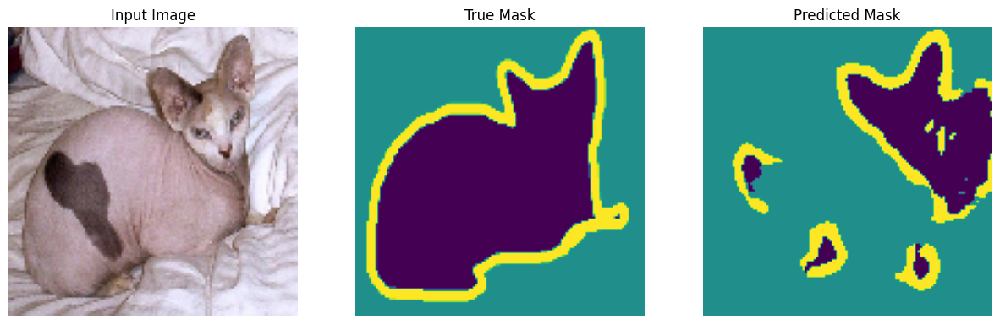

1/1 [==============================] - 0s 82ms/step


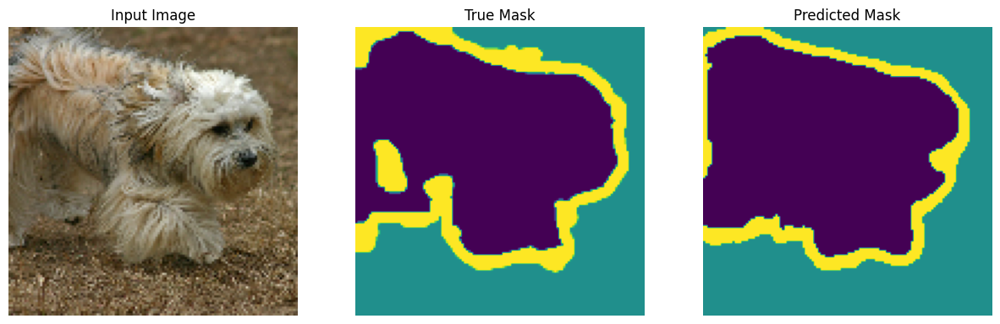

1/1 [==============================] - 0s 89ms/step


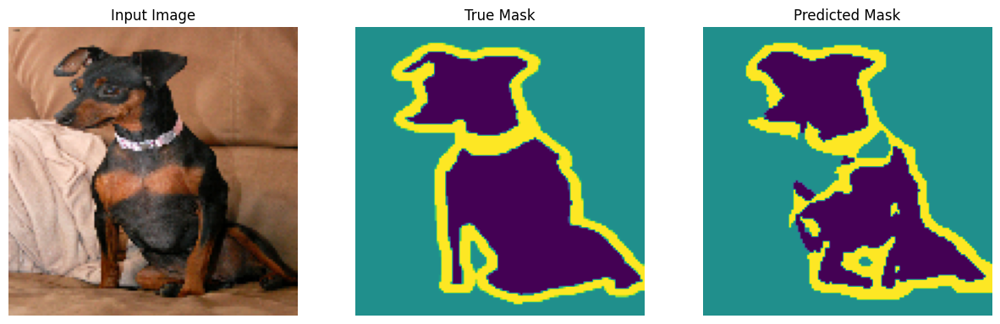

1/1 [==============================] - 0s 49ms/step


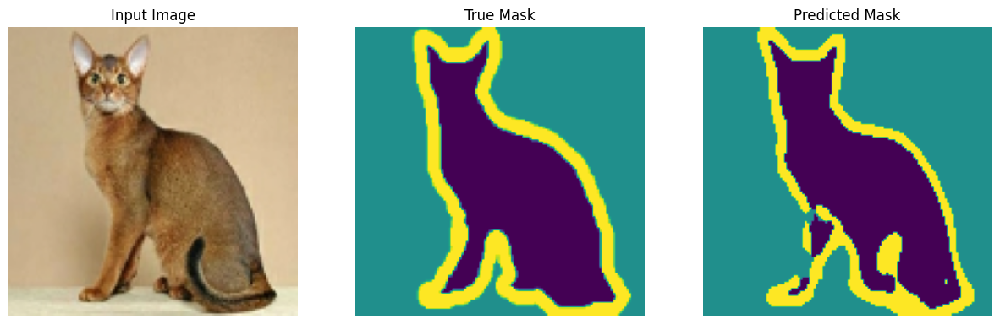

1/1 [==============================] - 0s 80ms/step


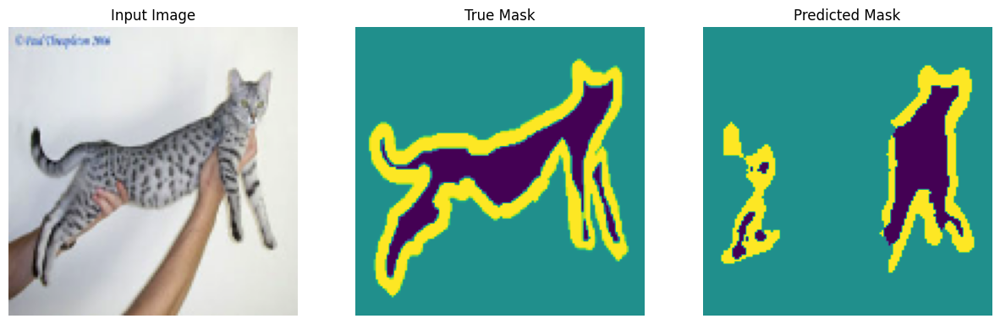

1/1 [==============================] - 0s 77ms/step


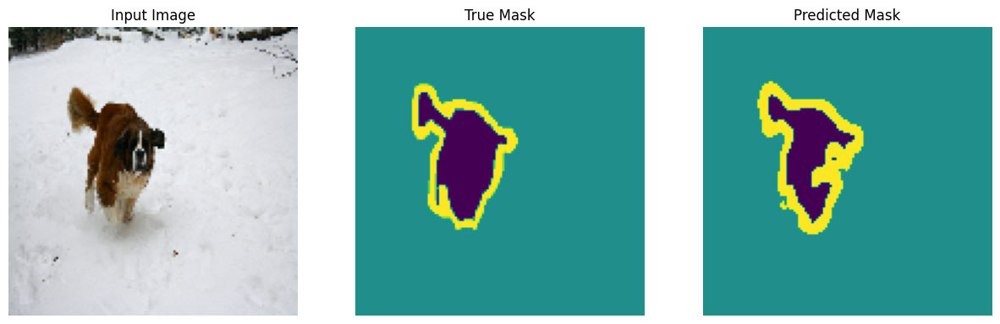

1/1 [==============================] - 0s 50ms/step


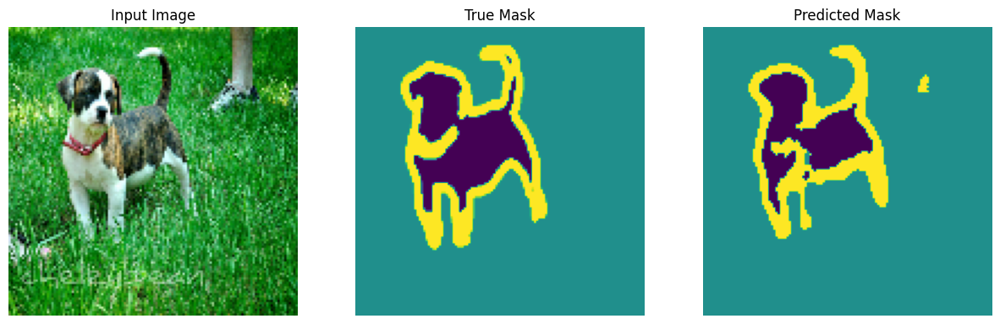

1/1 [==============================] - 0s 85ms/step


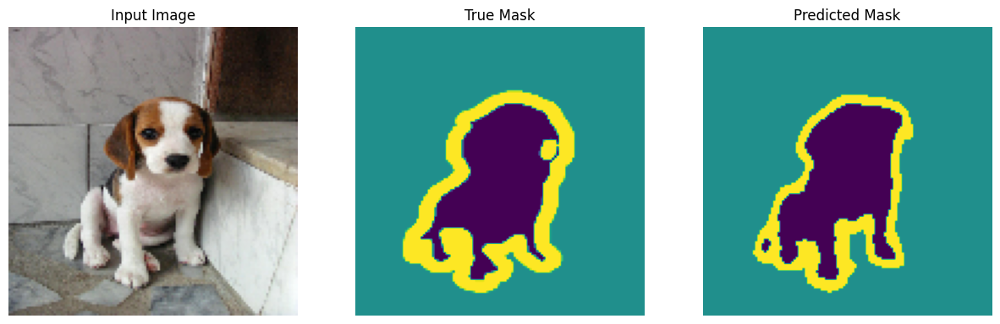

1/1 [==============================] - 0s 59ms/step


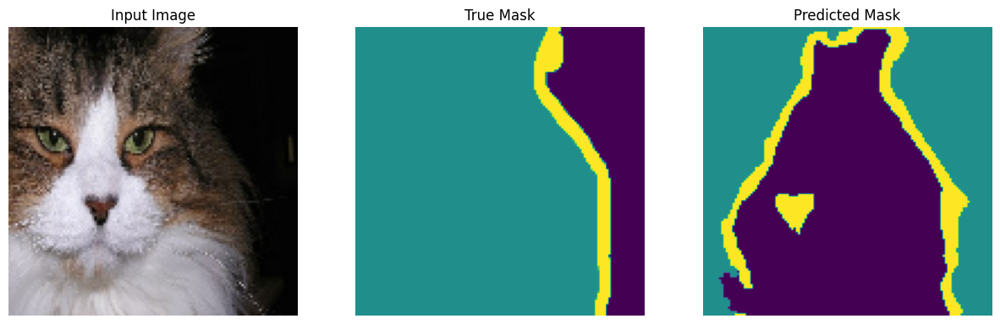

1/1 [==============================] - 0s 47ms/step


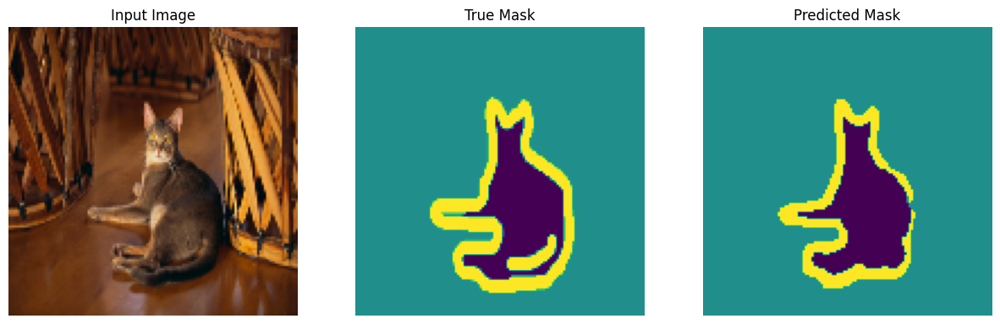

1/1 [==============================] - 0s 33ms/step


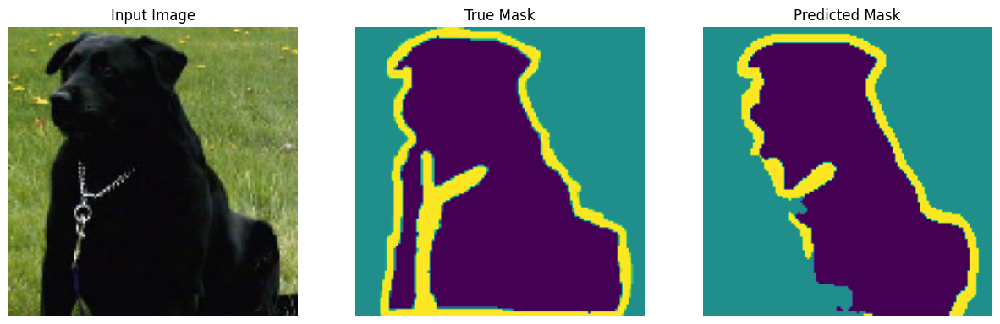

1/1 [==============================] - 0s 42ms/step


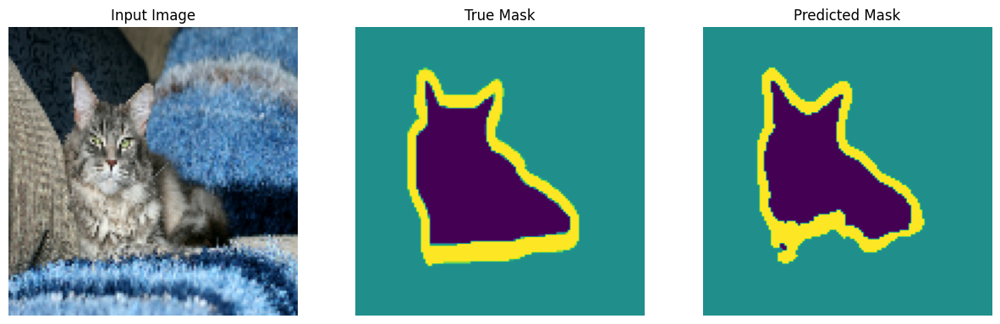

1/1 [==============================] - 0s 54ms/step


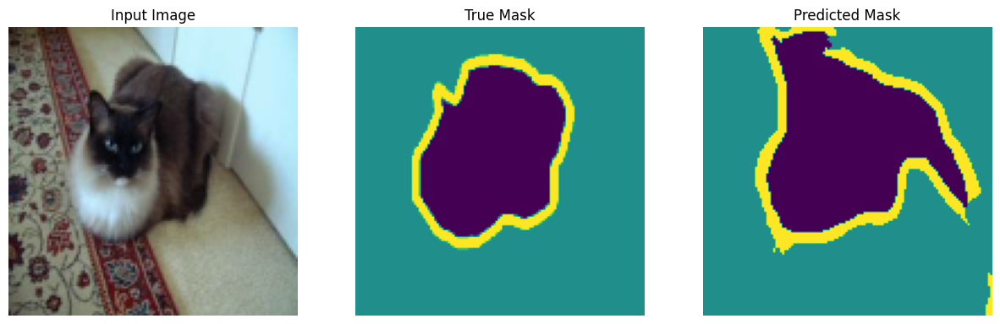

1/1 [==============================] - 0s 88ms/step


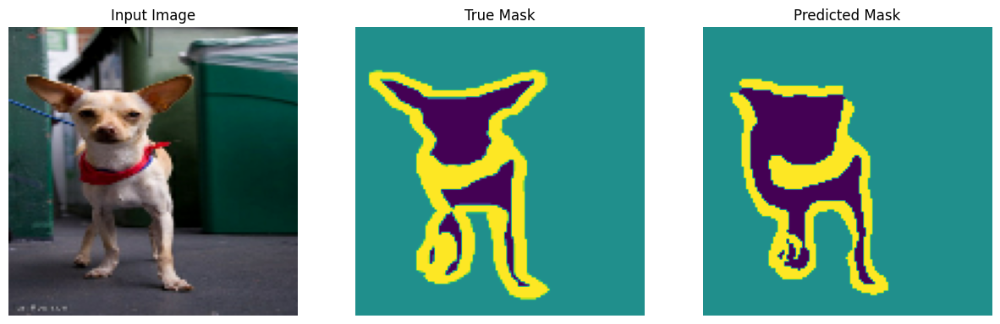

1/1 [==============================] - 0s 46ms/step


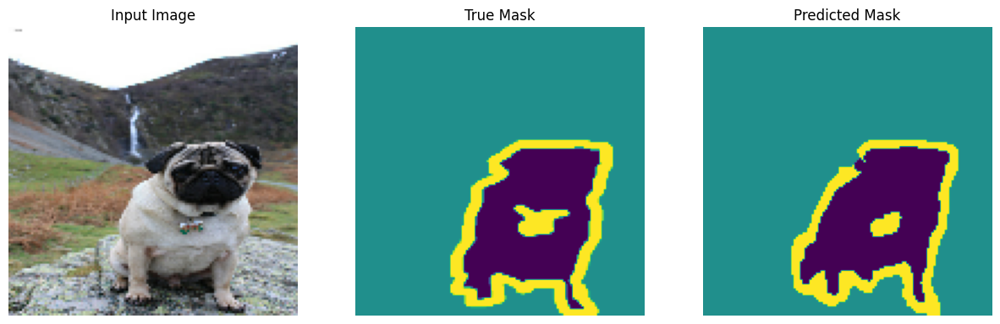

1/1 [==============================] - 0s 94ms/step


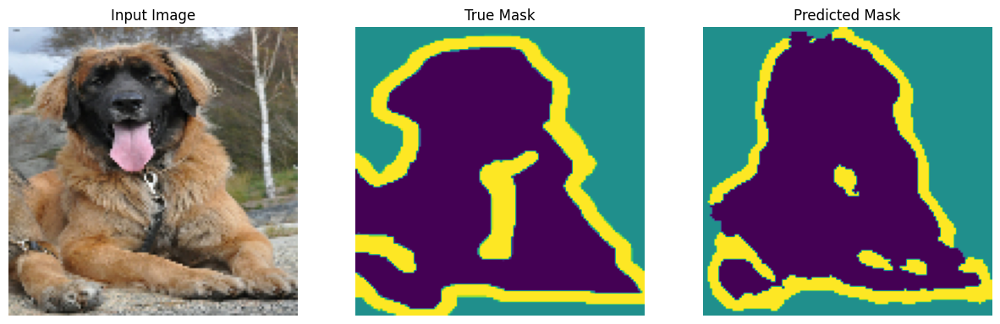

1/1 [==============================] - 0s 98ms/step


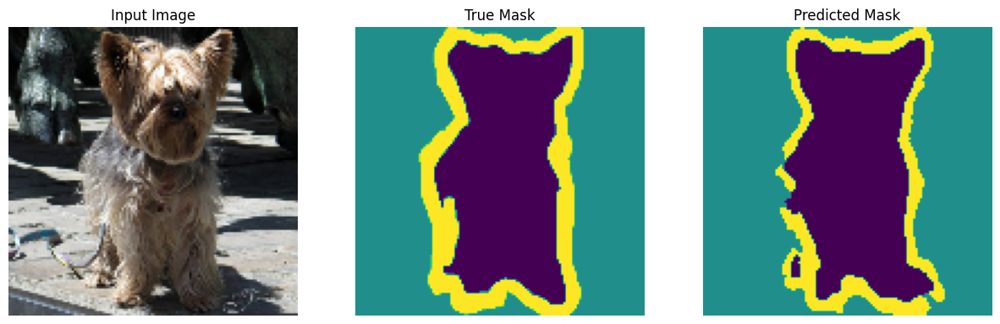

1/1 [==============================] - 0s 122ms/step


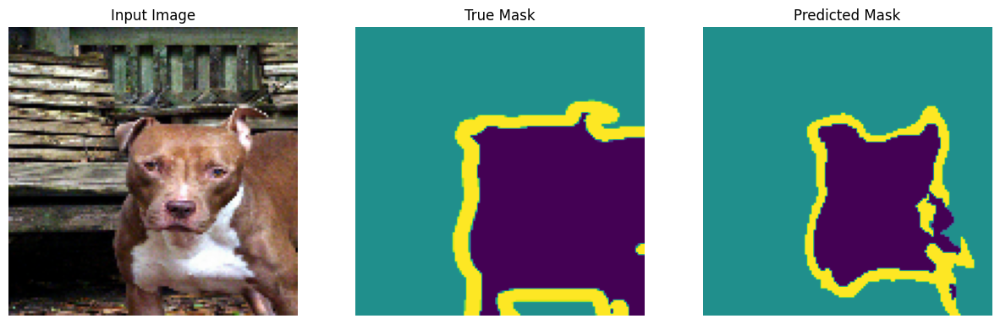

1/1 [==============================] - 0s 150ms/step


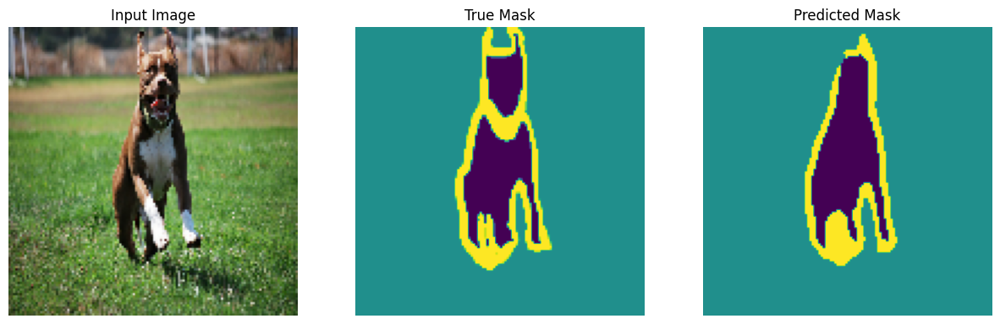

1/1 [==============================] - 0s 114ms/step


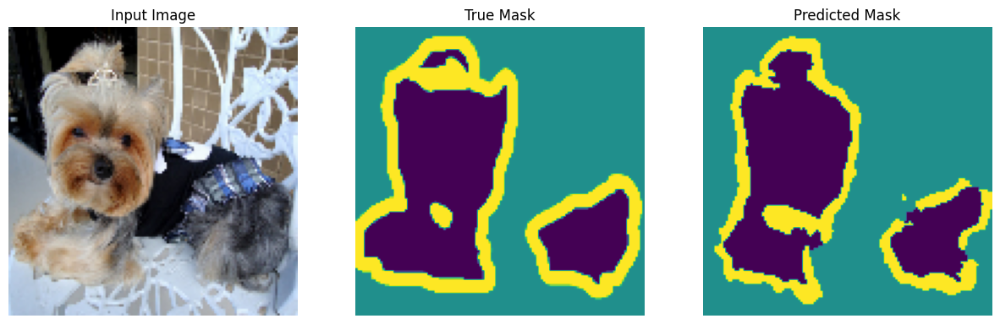

1/1 [==============================] - 0s 120ms/step


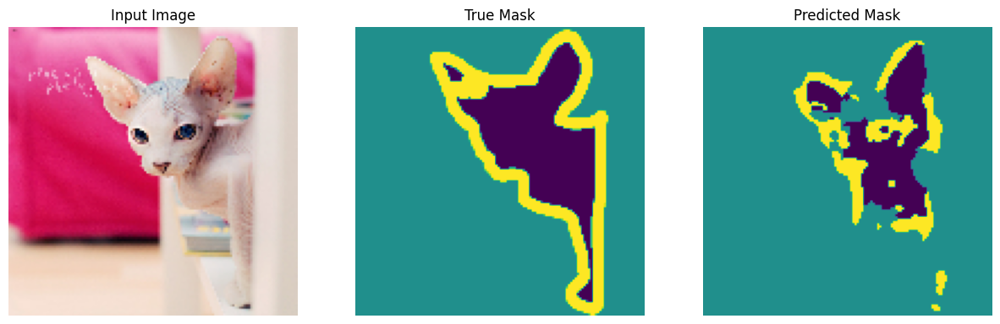

1/1 [==============================] - 0s 54ms/step


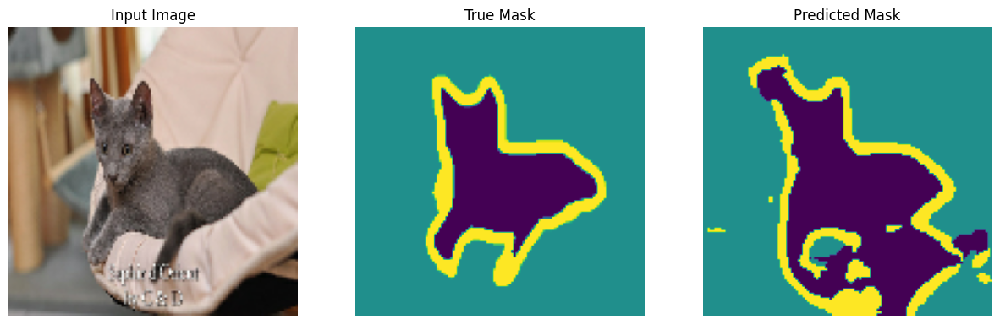

1/1 [==============================] - 0s 76ms/step


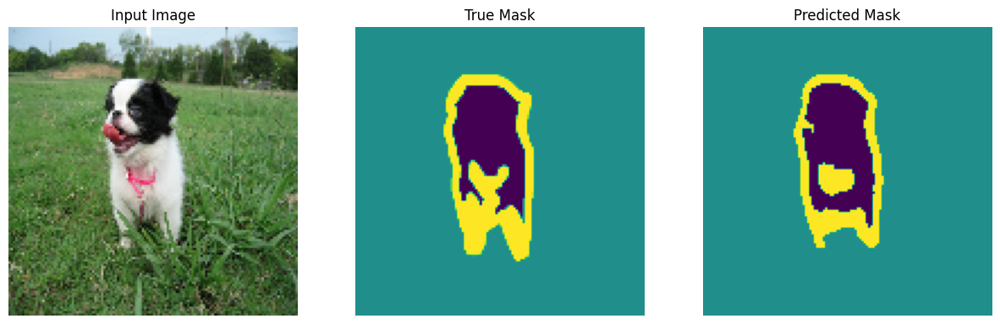

1/1 [==============================] - 0s 122ms/step


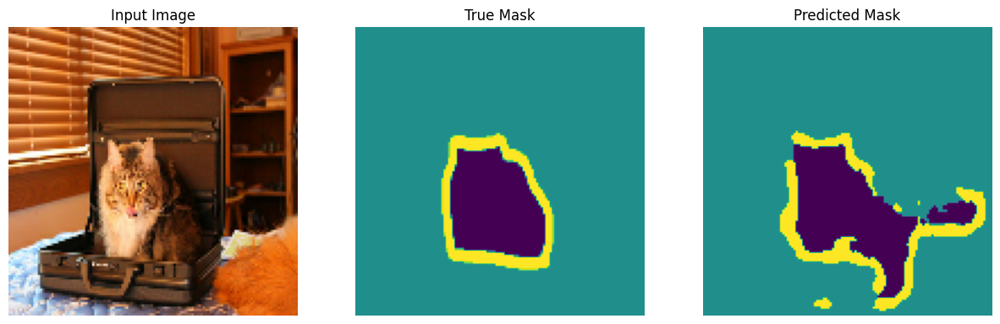

1/1 [==============================] - 0s 103ms/step


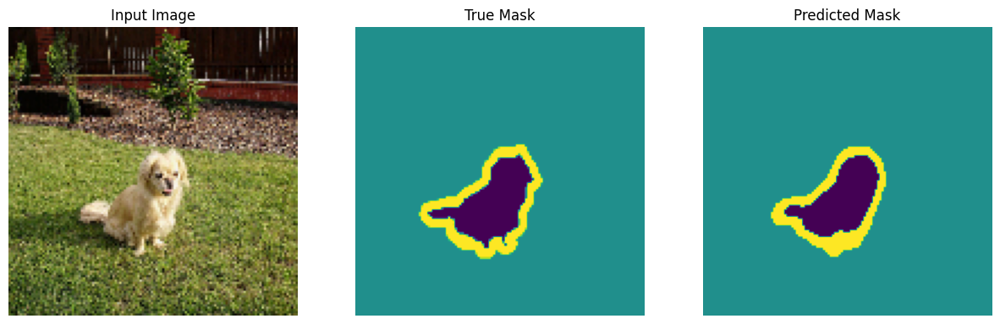

1/1 [==============================] - 0s 114ms/step


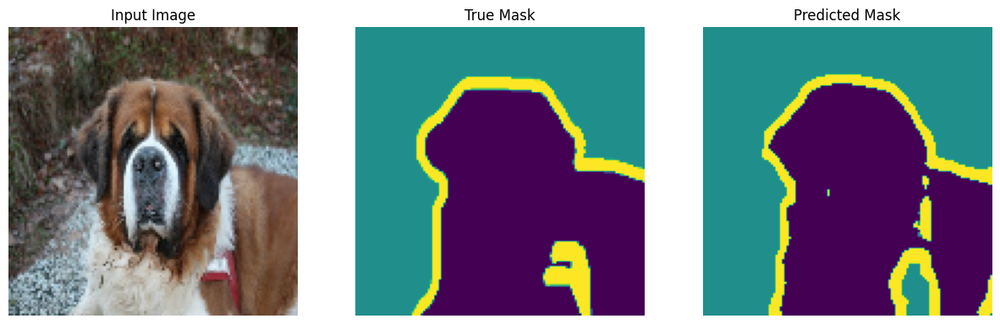

1/1 [==============================] - 0s 124ms/step


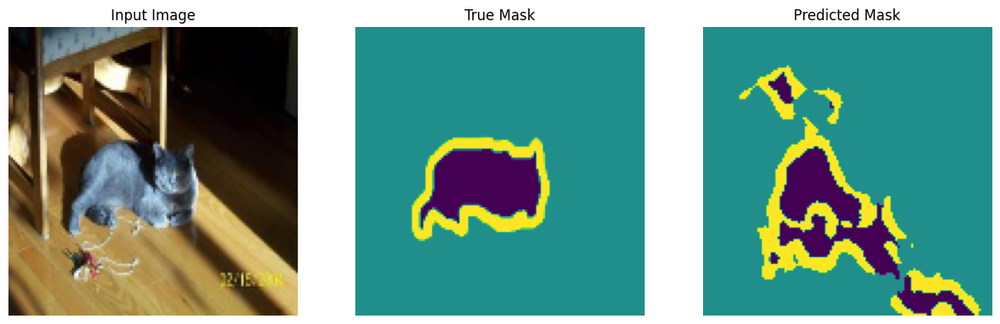

1/1 [==============================] - 0s 98ms/step


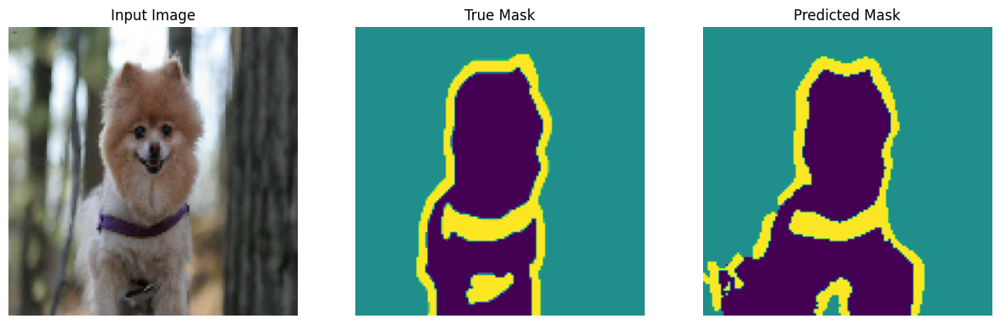

1/1 [==============================] - 0s 88ms/step


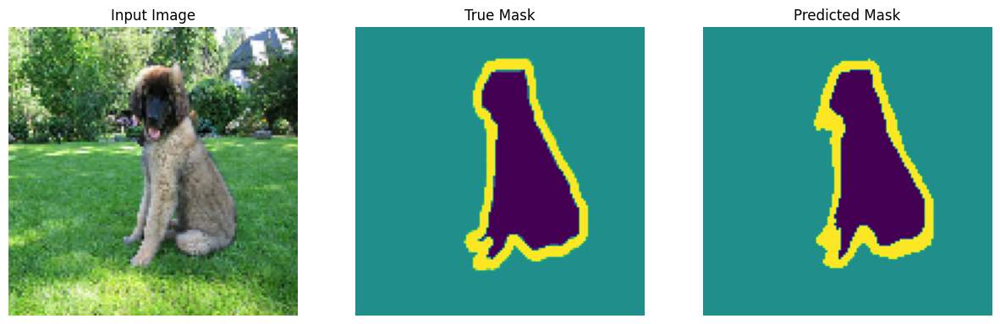

1/1 [==============================] - 0s 103ms/step


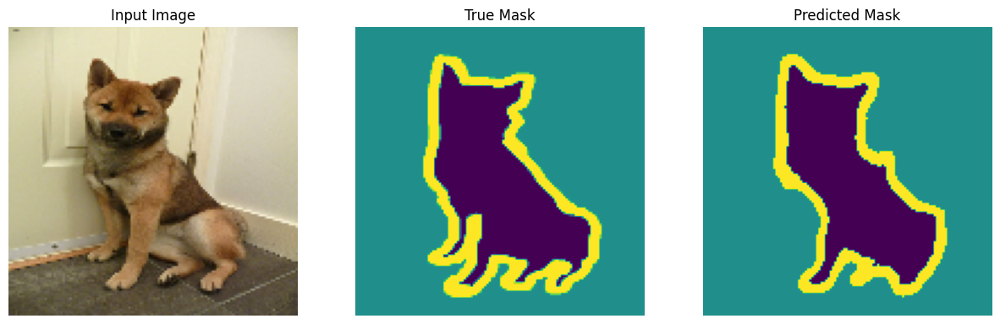

1/1 [==============================] - 0s 110ms/step


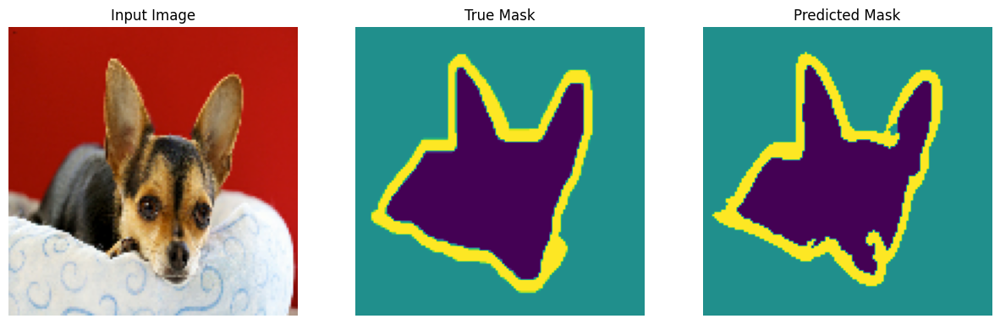

1/1 [==============================] - 0s 125ms/step


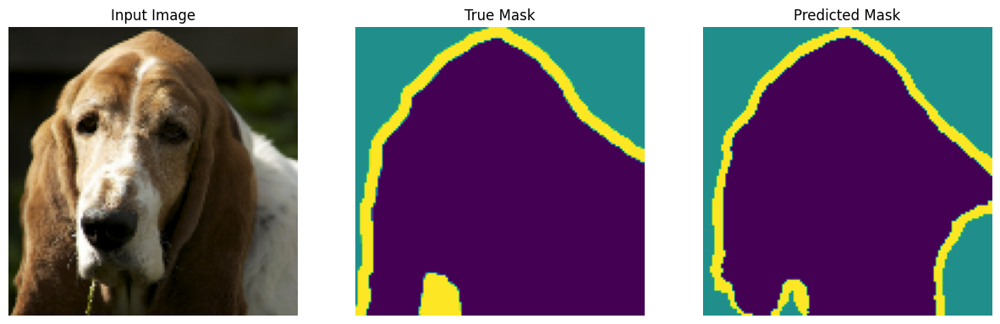

1/1 [==============================] - 0s 112ms/step


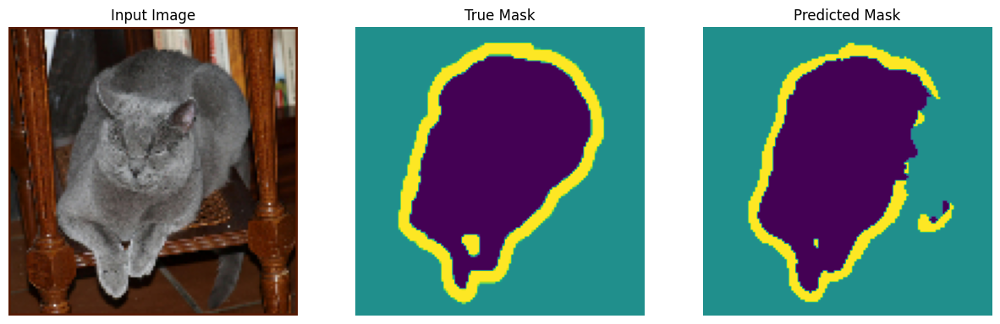

1/1 [==============================] - 0s 27ms/step


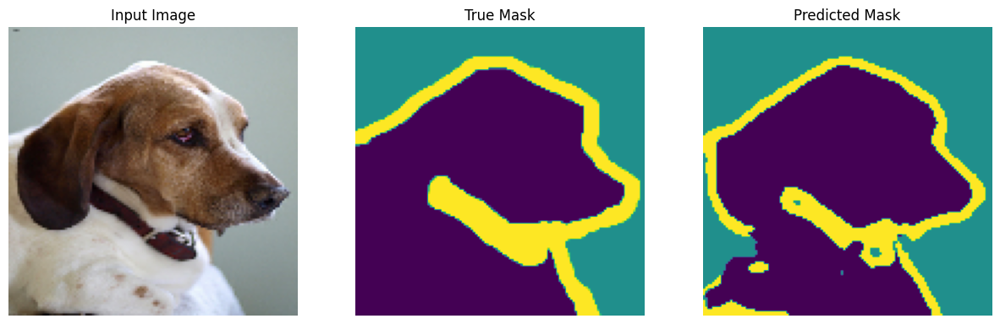

1/1 [==============================] - 0s 40ms/step


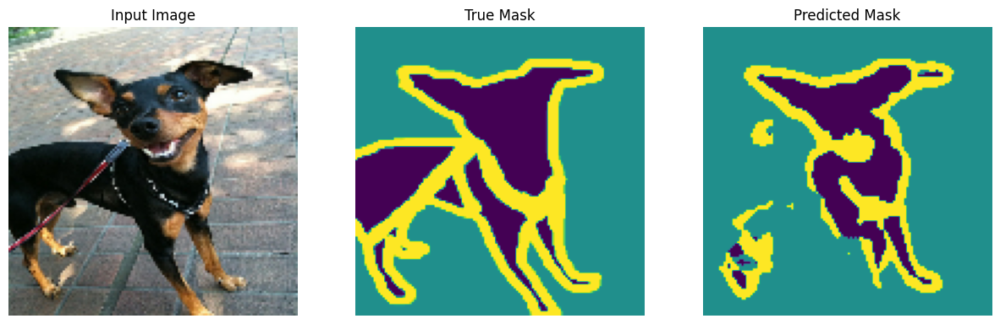

1/1 [==============================] - 0s 35ms/step


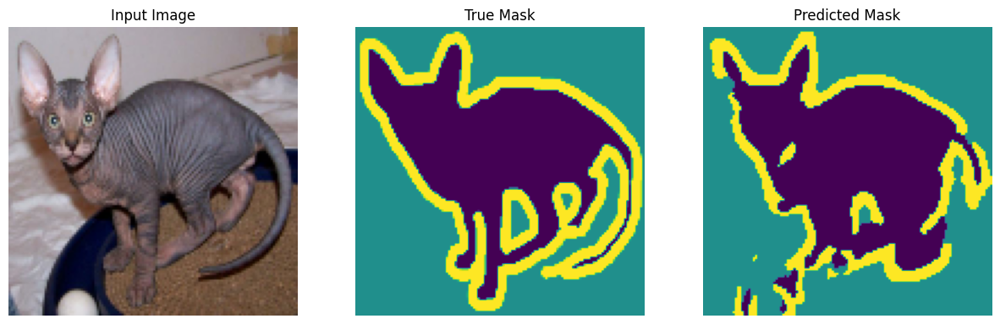

1/1 [==============================] - 0s 32ms/step


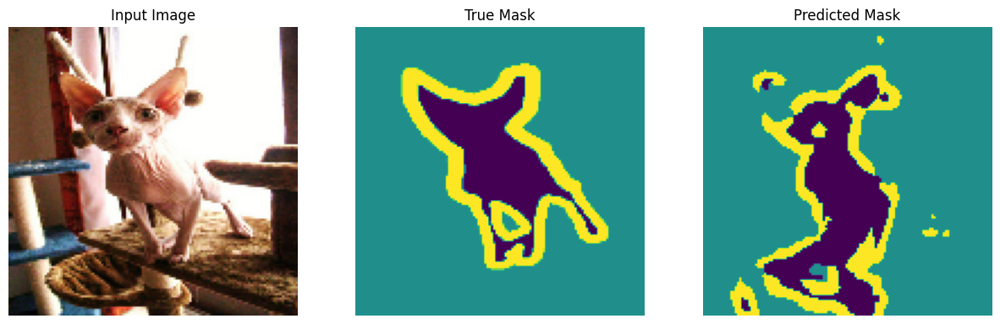

KeyboardInterrupt: ignored

In [38]:
for image_num, test_batch in enumerate(test_data):
  test_image, test_mask = test_batch
  test_image = test_image[0]
  test_mask = test_mask[0]

  display([test_image, test_mask, create_mask(unet_model.predict(test_image[tf.newaxis, ...]))])